In [1]:
import pandas as pd
import time
import numpy as np
import os
import copy

import seaborn as sns
import matplotlib.pyplot as plt
from PIL import Image

import torch
import torch.nn as nn
import torch.optim as optim
from torch.nn import functional as F
from torch.utils.data import Dataset, DataLoader
from torchvision import models
import torchvision.transforms as transforms

#augmentation
import albumentations
from albumentations.pytorch.transforms import ToTensorV2


#Load the data set

In [2]:
from zipfile import ZipFile
zf = ZipFile('/content/drive/MyDrive/CASSAVA/cassava-leaf-disease-classification.zip', 'r')
zf.extractall('/content/Data')
zf.close()

In [3]:
train = pd.read_csv("/content/Data/train.csv")
train.head()

,image_id,label
0,1000015157.jpg,0
1,1000201771.jpg,3
2,100042118.jpg,1
3,1000723321.jpg,1
4,1000812911.jpg,3


In [4]:
import json

In [5]:
# loading mapping for target label
with open("/content/Data/label_num_to_disease_map.json") as f:
  mapping = json.loads(f.read())
  mapping = {int(k):v for k,v in mapping.items()}
mapping


{0: 'Cassava Bacterial Blight (CBB)',
 1: 'Cassava Brown Streak Disease (CBSD)',
 2: 'Cassava Green Mottle (CGM)',
 3: 'Cassava Mosaic Disease (CMD)',
 4: 'Healthy'}

In [6]:
train['label_name'] = train['label'].map(mapping)

In [7]:
train.head()

,image_id,label,label_name
0,1000015157.jpg,0,Cassava Bacterial Blight (CBB)
1,1000201771.jpg,3,Cassava Mosaic Disease (CMD)
2,100042118.jpg,1,Cassava Brown Streak Disease (CBSD)
3,1000723321.jpg,1,Cassava Brown Streak Disease (CBSD)
4,1000812911.jpg,3,Cassava Mosaic Disease (CMD)


Exploratory Data Analysis

In [8]:
def plot_images(class_id, label, total_images=6):
  # get image ids corresponding to target class id
  plot_list = train[train['label']==class_id].sample(total_images)['image_id'].tolist()
  labels = [label for i in range(total_images)]

  #dynamically set size for subplot
  size = int(np.sqrt(total_images))
  if size*size  < total_images:
    size += 1

  # set figure size
  plt.figure(figsize = (20,20))

  #plot the image in subplot
  for index, (image_id, label) in enumerate(zip(plot_list, labels)):
    plt.subplot(size, size, index+1)
    image = Image.open(str("/content/Data/train_images/"+image_id))
    plt.imshow(image)
    plt.title(label, fontsize =14)
    plt.axis("off")
  plt.show()


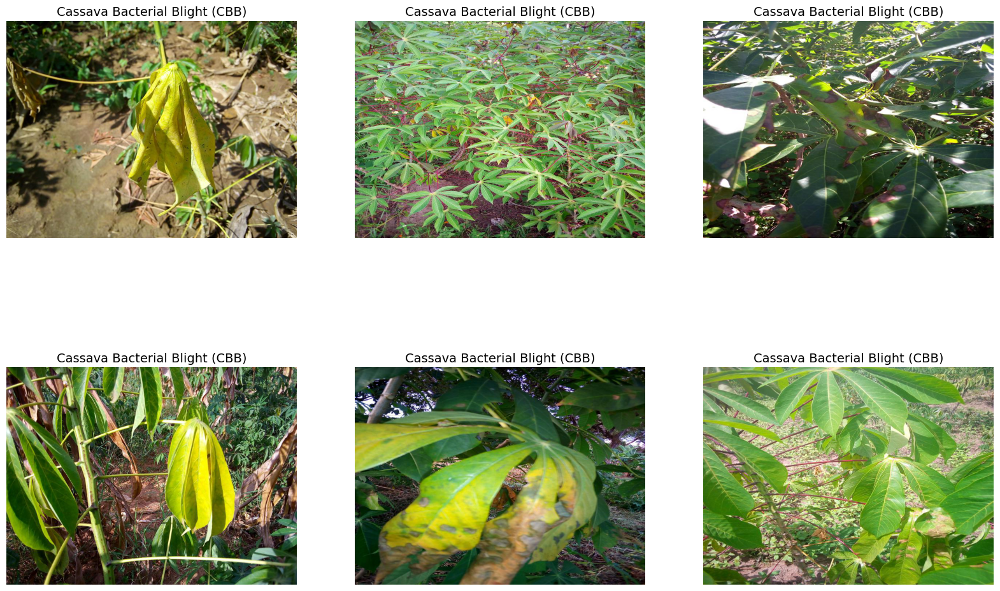

In [9]:
plot_images(0, mapping[0], 6)

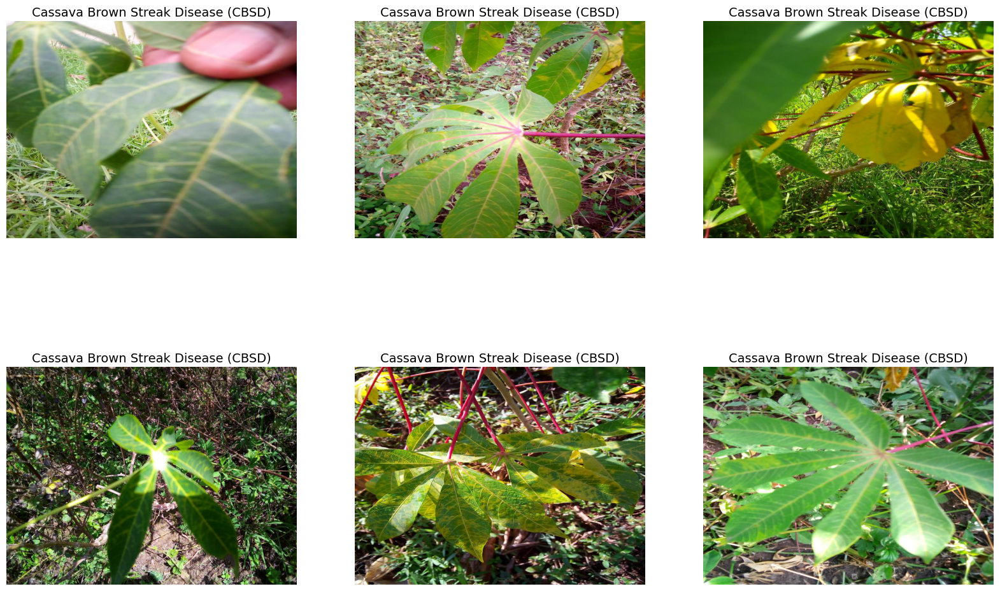

In [10]:
plot_images(1, mapping[1], 6)

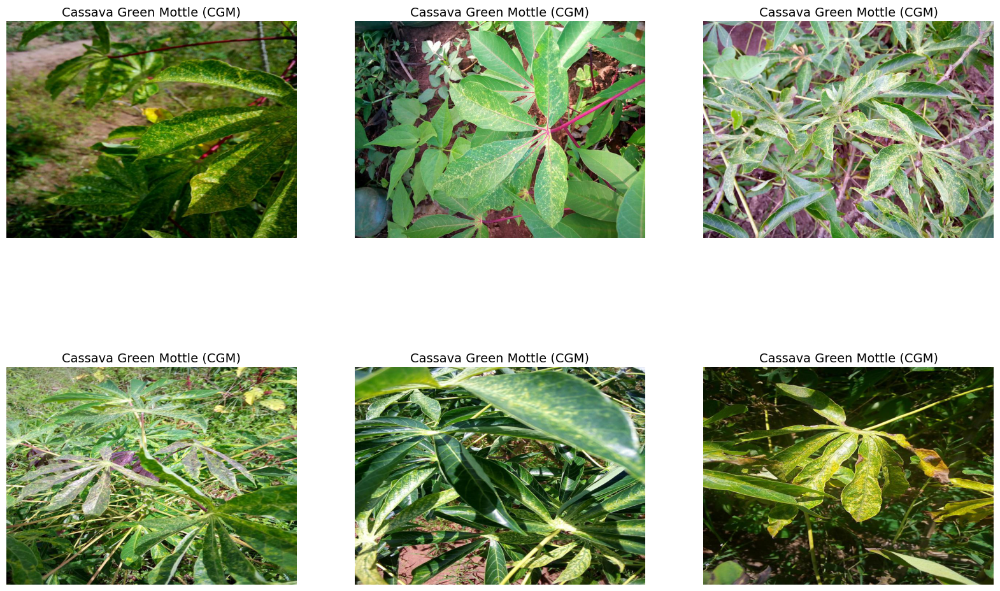

In [ ]:
plot_images(2, mapping[2], 6)

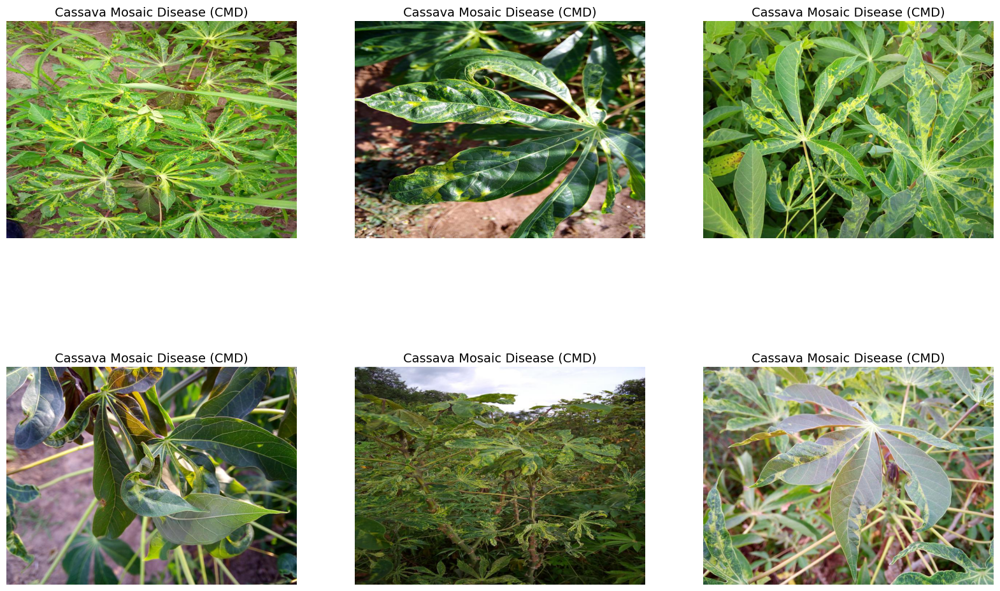

In [ ]:
plot_images(3, mapping[3], 6)

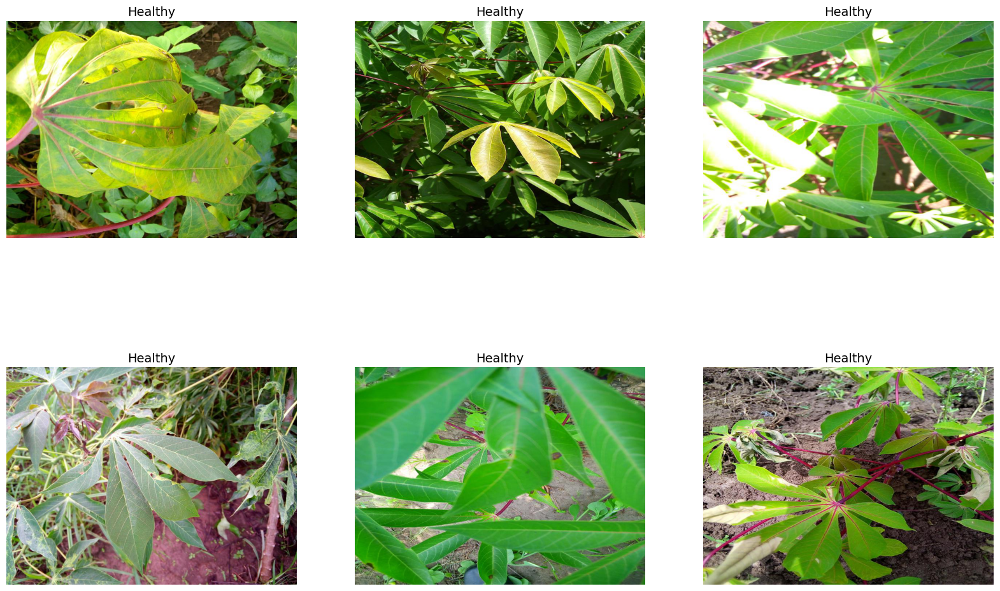

In [ ]:
plot_images(4, mapping[4], 6)

In [11]:
import warnings
warnings.filterwarnings('ignore')
%matplotlib inline

In [12]:
train['label_name'].unique

<bound method Series.unique of 0             Cassava Bacterial Blight (CBB)
1               Cassava Mosaic Disease (CMD)
2        Cassava Brown Streak Disease (CBSD)
3        Cassava Brown Streak Disease (CBSD)
4               Cassava Mosaic Disease (CMD)
                        ...                 
21392           Cassava Mosaic Disease (CMD)
21393           Cassava Mosaic Disease (CMD)
21394    Cassava Brown Streak Disease (CBSD)
21395                                Healthy
21396                                Healthy
Name: label_name, Length: 21397, dtype: object>

(array([0, 1, 2, 3, 4]),
 [Text(0, 0, 'Cassava Mosaic Disease (CMD)'),
  Text(1, 0, 'Healthy'),
  Text(2, 0, 'Cassava Green Mottle (CGM)'),
  Text(3, 0, 'Cassava Brown Streak Disease (CBSD)'),
  Text(4, 0, 'Cassava Bacterial Blight (CBB)')])

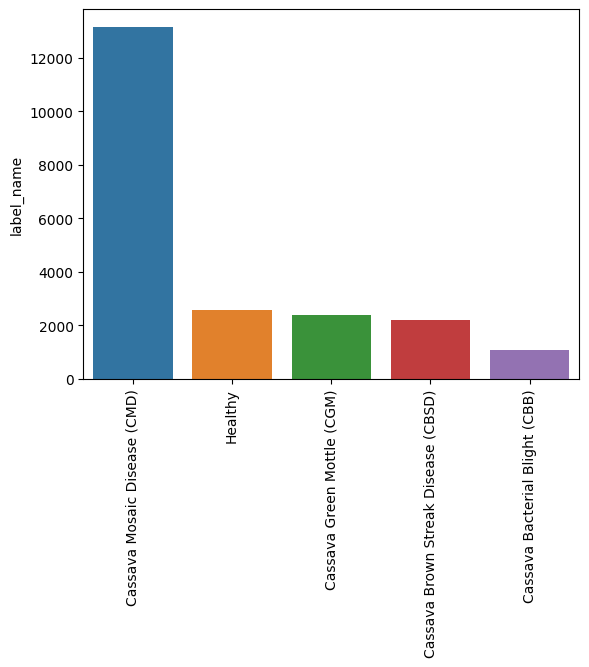

In [13]:
# class distribution
# count the occurrences of each label in the 'label_name' column
label_counts = train['label_name'].value_counts()

# create a bar plot of the label counts
sns.barplot(x=label_counts.index, y=label_counts)

# rotate the x-axis labels to avoid overlapping
plt.xticks(rotation=90)

## configuration and utility function

In [14]:
DIM = (256, 256)
WIDTH, HEIGHT = DIM
NUM_CLASSES = 5
NUM_WORKERS = 24
TRAIN_BATCH_SIZE = 32
TEST_BATCH_SIZE = 32

SEED = 1
DEVICE = 'cuda'

MEAN = [0.485, 0.456, 0.406]
STD = [0.229, 0.224,0.255]

AUGMENTATION

In [15]:
def get_test_transforms(value = 'val'):
  if value == 'train':
    return albumentations.Compose([
        albumentations.Resize(WIDTH, HEIGHT),
        albumentations.HorizontalFlip(p=0.5),
        albumentations.Rotate(limit=(90,90)),
        albumentations.VerticalFlip(p=0.5),
        albumentations.Normalize(MEAN, STD, max_pixel_value=255.0, always_apply=True),
        ToTensorV2(p=1.0)
    ])
  elif value == 'val':
    return albumentations.Compose([
        albumentations.Resize(WIDTH, HEIGHT),
        albumentations.Normalize(MEAN, STD, max_pixel_value=255.0, always_apply=True),
        ToTensorV2(p=1.0)
    ])

## Dataset Loader class

In [16]:
class CassavaDataset(Dataset):
  def __init__(self, image_ids, labels,dimension=None, augmentations=True, folder = "train_images"):
    super().__init__()
    self.image_ids = image_ids
    self.labels = labels
    self.dim = dimension
    self.augmentations = augmentations
    self.folder = folder

  ##return the length
  def __len__(self):
    return len(self.image_ids)
  ## return the image and label for that index
  def __getitem__(self, idx):
    img = Image.open(os.path.join("/content/Data/",self.folder, self.image_ids[idx]))
    if self.dim:
      img = img.resize(self.dim)

    # convert into numpy array
    img = np.array(img)
    if self.augmentations:
      augmented = self.augmentations(image = img)
      img = augmented['image']
    
    label = torch.tensor(self.labels[idx], dtype= torch.long)
    return img,label


In [17]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(train['image_id'],train['label'], test_size = 0.25)

In [28]:
#create dataloader for training and validation
train_dataset = CassavaDataset(
    image_ids = X_train.values,
    labels = y_train.values,
    augmentations = get_test_transforms('train'),
    dimension = DIM

)

train_loader = DataLoader(
    train_dataset,
    batch_size= TRAIN_BATCH_SIZE,
    num_workers=NUM_WORKERS,
    shuffle= False
)
val_dataset = CassavaDataset(
    image_ids = X_test.values,
    labels = y_test.values,
    augmentations = get_test_transforms('val'),
    dimension = DIM
)

val_loader = DataLoader(
    val_dataset,
    batch_size= TEST_BATCH_SIZE,
    num_workers=NUM_WORKERS,
    shuffle= False
)
loaders = {'train': train_loader, 'val': val_loader}

In [19]:
val_dataset[0]

(tensor([[[-0.5253, -0.7479, -1.6042,  ..., -1.3644, -1.6213, -1.9124],
          [-0.6109, -0.7650, -1.6727,  ..., -1.4672, -1.7754, -1.9124],
          [-0.8164, -0.8678, -1.7412,  ..., -1.6042, -1.6213, -1.7069],
          ...,
          [-1.6042, -0.4568,  0.6734,  ..., -0.7479, -1.1760, -0.8849],
          [ 0.5022,  1.1872,  0.8618,  ..., -1.2445, -1.3302, -1.1075],
          [ 0.5878,  0.4679,  0.4337,  ..., -0.2856, -0.8164, -0.8335]],
 
         [[-1.0203, -0.9328, -1.4405,  ..., -0.9328, -1.0028, -1.1078],
          [-1.1078, -0.9503, -1.4930,  ..., -1.0203, -1.1779, -1.1604],
          [-1.2304, -1.0028, -1.5455,  ..., -1.1078, -1.0553, -1.0553],
          ...,
          [-1.6506, -0.4426,  0.7654,  ..., -0.6352, -1.0203, -0.9678],
          [ 0.5378,  1.2206,  0.8704,  ..., -1.2654, -1.2829, -1.3004],
          [ 0.5378,  0.3627,  0.2927,  ..., -0.4251, -0.8803, -1.1429]],
 
         [[-0.5925, -0.6387, -1.2384,  ..., -1.0539, -1.2231, -1.4537],
          [-0.7002, -0.6694,

## Use petrained model (Transfer Learning)

In [20]:
def getModel():
  net = models.resnet152(pretrained= True)
  # if you want to train whole network , comment this code
  # freeze all the layer in the network
  for param in net.parameters():
    param.requires_grad = False

  num_fltrs = net.fc.in_features
  # create last few layers
  net.fc = nn.Sequential(
      nn.Linear(num_fltrs,256),
      nn.ReLU(),
      nn.Dropout(0.3),
      nn.Linear(256, NUM_CLASSES), 
      nn.LogSoftmax(dim=1)
  ) 
  # use gpu if any
  net = net.cuda() if DEVICE else net
  return net

In [21]:
model = getModel()

Downloading: "https://download.pytorch.org/models/resnet152-394f9c45.pth" to /root/.cache/torch/hub/checkpoints/resnet152-394f9c45.pth
100%|██████████| 230M/230M [00:04<00:00, 55.4MB/s]


In [23]:
import math
def cyclical_lr(stepsize, min_lr=3e-4, max_lr=3e-3):

    # Scaler: we can adapt this if we do not want the triangular CLR
    scaler = lambda x: 1.

    # Lambda function to calculate the LR
    lr_lambda = lambda it: min_lr + (max_lr - min_lr) * relative(it, stepsize)

    # Additional function to see where on the cycle we are
    def relative(it, stepsize):
        cycle = math.floor(1 + it / (2 * stepsize))
        x = abs(it / stepsize - 2 * cycle + 1)
        return max(0, (1 - x)) * scaler(cycle)

    return lr_lambda

In [24]:
criterion = nn.CrossEntropyLoss()
optimizer = torch.optim.Adam(model.parameters(), lr=0.1)
#optimizer = torch.optim.SGD(model.parameters(), lr=1., momentum=0.9)
step_size = 4*len(train_loader)
clr = cyclical_lr(step_size, min_lr=3e-4, max_lr=3e-3)
scheduler = torch.optim.lr_scheduler.LambdaLR(optimizer, [clr])

In [25]:
# freeze (or) unfreeze all the layers
unfreeze = True # to freeze, set it as False
for param in model.parameters():
    param.requires_grad = unfreeze

In [26]:
# find total parameters and trainable parameters
total_params = sum(p.numel() for p in model.parameters())
print(f'{total_params:,} total parameters')
trainable_params = sum(p.numel() for p in model.parameters() if p.requires_grad)
print(f'{trainable_params:,} training parameters')

58,669,637 total parameters
58,669,637 training parameters


In [27]:
def train_model(model, dataloaders, criterion, optimizer, num_epochs=5, scheduler=scheduler):
    # set starting time
    start_time = time.time()
    
    val_acc_history = []
    
    best_model_wts = copy.deepcopy(model.state_dict())
    best_acc = 0.0
    
    for epoch in range(num_epochs):
        print(f'Epoch {epoch}/{num_epochs-1}')
        print('-'*15)
        
        # each epoch have training and validation phase
        for phase in ['train', 'val']:
            # set mode for model
            if phase == 'train':
                model.train() # set model to training mode
            else:
                model.eval() # set model to evaluate mode
                
            running_loss = 0.0
            running_corrects = 0
            fin_out = []
            
            # iterate over data
            for inputs, labels in dataloaders[phase]:
                # move data to corresponding hardware
                inputs = inputs.to(DEVICE)
                labels = labels.to(DEVICE)
                   # reset (or) zero the parameter gradients
                optimizer.zero_grad()
                
                # training (or) validation process
                with torch.set_grad_enabled(phase=='train'):
                    outputs = model(inputs)
                    loss = criterion(outputs, labels)
                    
                    _, preds = torch.max(outputs, 1)
                    
                    # back propagation in the network
                    if phase == 'train':
                        loss.backward()
                        optimizer.step()
                        scheduler.step()
                        
                running_loss += loss.item() * inputs.size(0)
                running_corrects += torch.sum(preds == labels.data)
                        
            # calculate loss and accuarcy for the epoch
            epoch_loss = running_loss / len(dataloaders[phase].dataset)
            epoch_acc = running_corrects.double() / len(dataloaders[phase].dataset)
                
            # print loss and acc for training & validation
            print('{} Loss: {:.4f} Acc: {:.4f}'.format(phase, epoch_loss, epoch_acc))
                
            # update the best weights
            if phase == 'val' and epoch_acc > best_acc:
                best_acc = epoch_acc
                best_model_wts = copy.deepcopy(model.state_dict())
            if phase == 'val':
                val_acc_history.append(epoch_acc)
                
        print()
    end_time = time.time() - start_time
    
    print('Training completes in {:.0f}m {:.0f}s'.format(end_time // 60, end_time % 60))
    print('Best Val Acc: {:.4f}'.format(best_acc))
    
    # load best model weights
     # load best model weights
    model.load_state_dict(best_model_wts)
    return model, val_acc_history

In [41]:
#train the model
model, accuracy = train_model(model=model, dataloaders=loaders, criterion=criterion, optimizer=optimizer, num_epochs=5, scheduler= scheduler)

Epoch 0/4
---------------
train Loss: 0.3259 Acc: 0.8899
val Loss: 0.4048 Acc: 0.8630

Epoch 1/4
---------------
train Loss: 0.3257 Acc: 0.8890
val Loss: 0.4001 Acc: 0.8647

Epoch 2/4
---------------
train Loss: 0.3176 Acc: 0.8920
val Loss: 0.3991 Acc: 0.8641

Epoch 3/4
---------------
train Loss: 0.3213 Acc: 0.8921
val Loss: 0.4071 Acc: 0.8602

Epoch 4/4
---------------
train Loss: 0.3192 Acc: 0.8924
val Loss: 0.3996 Acc: 0.8645

Training completes in 40m 2s
Best Val Acc: 0.8647


In [42]:
# save the model and model weight

torch.save(model,"/content/artifacts/best_model.h5" )
torch.save(model.state_dict(), "/content/artifacts/best_model_weights")

In [43]:
# freeze or unfreeze all the layer 
unfreeze = False # to freeze set it as False
for param in model.parameters():
  param.requires_grad = unfreeze


In [44]:
# unfreeze selected layers
layers = list(range(5))
i=0
for layer in model.children():
  if i in layers:
    for param in layer.parameters():
      param.requires_grad = True
  i += 1

In [45]:
# find total parameters and trainable parameters
total_params = sum(p.numel() for p in model.parameters())
print(f'{total_params:,} total parameters')
trainable_params = sum(p.numel() for p in model.parameters() if p.requires_grad)
print(f'{trainable_params:,} training parameters')

58,669,637 total parameters
225,344 training parameters


## Testing the model 

In [46]:
def predict(model, dataloaders, device):
  # set mode 
  model.eval()
  fin_out = []
  with torch.no_grad():
    for images, target in dataloaders:
      images = images.to(device)
      target = target.to(device)

      outputs = model(images)

      fin_out.append(F.softmax(outputs, dim = 1).detach().cpu().numpy())
    return np.concatenate(fin_out)


In [47]:
# step for model prediction
device = torch.device('cuda') # if don't have GPU set it as CPU
model.to(device)
pred = predict(model, val_loader, device)
pred = pred.argmax(axis=1)

In [51]:
pred[5:15]

array([2, 3, 3, 0, 3, 3, 3, 2, 3, 3])

In [52]:
y_test.values[5:15]

array([4, 3, 3, 4, 3, 3, 3, 2, 3, 3])